# Problem Statement

![alt text](https://sukanta-27.tinytake.com/media/d08cfd?filename=1590812021759_TinyTake30-05-2020-09-43-09.png&sub_type=thumbnail_preview&type=attachment&width=797&height=168)

![alt text](https://sukanta-27.tinytake.com/media/d08d0e?filename=1590812068854_TinyTake30-05-2020-09-44-24.png&sub_type=thumbnail_preview&type=attachment&width=581&height=603)

![alt text](https://sukanta-27.tinytake.com/media/d08d22?filename=1590812108794_TinyTake30-05-2020-09-45-04.png&sub_type=thumbnail_preview&type=attachment&width=798&height=326)

# Utility Functions

In [0]:
# Make prediction on Test data and save to drive
def make_submission(final_test, ID, model, filename, isProb=False):
  y_pred = model.predict(final_test)

  # If the predictions are probabilities then convert them to class labels
  if(isProb):
    y_pred.reshape(3, -1)
    y_pred = y_pred.argmax(axis=1)
    y_pred += 1
    print("Unique values: ", np.unique(y_pred))
  df = pd.DataFrame(ID, columns=["Loan_ID"])
  df["Interest_Rate"] = y_pred
  df.to_csv("Submissions/"+filename+".csv", index=False)
  return "File Saved to Drive"

In [0]:
%matplotlib inline
# Calculate confusion matrix and Weighted F1-score
def calculate_f1(y_pred, y_true):
  # Print F1 Score
  print("Calculating the Weighted F1 Score")
  score = f1_score(y_true, y_pred, average="weighted")
  print("The Weighted F1_Score: ", score)

  # Plot Confusion Matrix
  cm = confusion_matrix(y_true, y_pred)
  df = pd.DataFrame(cm, index=[1,2,3], columns=[1,2,3])
  sns.heatmap(df, annot=True, fmt='g')

# Load Data

In [0]:
import pandas as pd
import datetime
import time

# if numpy is not installed already : pip3 install numpy
import numpy as np

# matplotlib: used to plot graphs
import matplotlib
%matplotlib inline

matplotlib.use('nbagg')
import matplotlib.pylab as plt
import seaborn as sns#Plots
from matplotlib import rcParams #Size of plots  
import math
import pickle
import os

import xgboost as xgb
import lightgbm as lgb

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import StackingClassifier

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix

from sklearn import preprocessing
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
os.chdir("/content/drive/My Drive/Machine Learning Competitions/JanataHack: Machine Learning For Banking ")

In [0]:
# Creating folders to save intermediate files and models

# os.mkdir("Submissions")
# os.mkdir("Models")
# os.mkdir("Preprocessed")

In [0]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [0]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164309 entries, 0 to 164308
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Loan_ID                  164309 non-null  int64  
 1   Loan_Amount_Requested    164309 non-null  object 
 2   Length_Employed          156938 non-null  object 
 3   Home_Owner               138960 non-null  object 
 4   Annual_Income            139207 non-null  float64
 5   Income_Verified          164309 non-null  object 
 6   Purpose_Of_Loan          164309 non-null  object 
 7   Debt_To_Income           164309 non-null  float64
 8   Inquiries_Last_6Mo       164309 non-null  int64  
 9   Months_Since_Deliquency  75930 non-null   float64
 10  Number_Open_Accounts     164309 non-null  int64  
 11  Total_Accounts           164309 non-null  int64  
 12  Gender                   164309 non-null  object 
 13  Interest_Rate            164309 non-null  int64  
dtypes: f

In [0]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109541 entries, 0 to 109540
Data columns (total 13 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Loan_ID                  109541 non-null  int64  
 1   Loan_Amount_Requested    109541 non-null  object 
 2   Length_Employed          104605 non-null  object 
 3   Home_Owner               92830 non-null   object 
 4   Annual_Income            92643 non-null   float64
 5   Income_Verified          109541 non-null  object 
 6   Purpose_Of_Loan          109541 non-null  object 
 7   Debt_To_Income           109541 non-null  float64
 8   Inquiries_Last_6Mo       109541 non-null  int64  
 9   Months_Since_Deliquency  50682 non-null   float64
 10  Number_Open_Accounts     109541 non-null  int64  
 11  Total_Accounts           109541 non-null  int64  
 12  Gender                   109541 non-null  object 
dtypes: float64(3), int64(4), object(6)
memory usage: 10.9+ MB


Seems like there are quite a few missing values for some of the features. A more detailed EDA will help better understand the data at hand.

# Exploratory Data Analysis

For Exploratory Data Analysis I will use Pandas_profiling.

Blog link explaining Pandas_Profiling: [Link](https://towardsdatascience.com/accelerate-your-exploratory-data-analysis-with-pandas-profiling-4eca0cb770d1)

## Pandas_Profiling

In [0]:
!pip uninstall pandas_profiling

Uninstalling pandas-profiling-1.4.1:
  Would remove:
    /usr/local/lib/python3.6/dist-packages/pandas_profiling-1.4.1.dist-info/*
    /usr/local/lib/python3.6/dist-packages/pandas_profiling/*
Proceed (y/n)? y
  Successfully uninstalled pandas-profiling-1.4.1


In [0]:
!pip install pandas-profiling[notebook,html]

### Train Data

In [0]:
import pandas_profiling
profile = pandas_profiling.ProfileReport(train, title='Pandas Profiling Report For Train Dataset', html={'style':{'full_width':True}})

In [0]:
profile.to_notebook_iframe()

In [0]:
profile.to_file(output_file="trainData_report.html")

### Test Data

In [0]:
profile = pandas_profiling.ProfileReport(test, title='Pandas Profiling Report For Test Dataset', html={'style':{'full_width':True}})

In [0]:
profile.to_notebook_iframe()

In [0]:
profile.to_file(output_file="TestData_report.html")

# Data Preprocessing

## Preprocess the Length Employed Feature

In [0]:
train["Length_Employed"].value_counts()

10+ years    52915
2 years      14620
3 years      12974
< 1 year     12805
5 years      10814
1 year       10422
4 years       9784
7 years       9308
6 years       9094
8 years       7917
9 years       6285
Name: Length_Employed, dtype: int64

Here to proceed with to the modelling part, first these values should be changed to numbers.

I will be changing "10+ years" to 11, and "< 1 years" to 0.

In [0]:
def preprocess_length_employed_feature(series):
  series.replace("10+ years", "11", inplace=True)
  series.replace("< 1 year", "0", inplace=True)
  series.replace("1 year", "1", inplace=True)
  series.replace("2 years", "2", inplace=True)
  series.replace("3 years", "3", inplace=True)
  series.replace("4 years", "4", inplace=True)
  series.replace("5 years", "5", inplace=True)
  series.replace("6 years", "6", inplace=True)
  series.replace("7 years", "7", inplace=True)
  series.replace("8 years", "8", inplace=True)
  series.replace("9 years", "9", inplace=True)

  return series

In [0]:
preprocess_length_employed_feature(train["Length_Employed"])

0          0
1          4
2          7
3          0
4          8
          ..
164304    11
164305     8
164306    11
164307     4
164308    11
Name: Length_Employed, Length: 164309, dtype: object

In [0]:
train["Length_Employed"].value_counts()

11    52915
2     14620
3     12974
0     12805
5     10814
1     10422
4      9784
7      9308
6      9094
8      7917
9      6285
Name: Length_Employed, dtype: int64

In [0]:
preprocess_length_employed_feature(test["Length_Employed"])

0         11
1         11
2          0
3         11
4          0
          ..
109536     9
109537    11
109538     5
109539     6
109540     2
Name: Length_Employed, Length: 109541, dtype: object

In [0]:
test["Length_Employed"].value_counts()

11    35413
2      9800
3      8504
0      8328
5      7228
1      6914
4      6609
6      6257
7      6136
8      5198
9      4218
Name: Length_Employed, dtype: int64

## Fill Missing values

In [0]:
def fill_missing_values(df):
  # For Length_Employed feature
  print("Filling the missing values in the Length Employed feature with 0")
  df["Length_Employed"].fillna(0, inplace=True)
  print("*"*50)

  # For Home Owner feature
  print("Filling the missing values in the Home Owner feature with \"Other\"")
  df["Home_Owner"].fillna("Other", inplace=True)
  print("*"*50)

  # For Annual Income feature
  median_annual_income_train = train["Annual_Income"].median()
  print("The Median Annual Income in the train dataset is: ", median_annual_income_train)
  print("Filling the missing values in the annual income feature with median")
  df["Annual_Income"].fillna(median_annual_income_train, inplace=True)
  print("*"*50)
  
  # For Months since Deliquency feature
  median_months_since_deliquency = train["Months_Since_Deliquency"].median()
  print("The Median Months_Since_Deliquency in the train dataset is: ", median_months_since_deliquency)
  print("Filling the missing values in the Months_Since_Deliquency feature with median")
  df["Months_Since_Deliquency"].fillna(median_months_since_deliquency, inplace=True)

In [0]:
fill_missing_values(train)

Filling the missing values in the Length Employed feature with 0
**************************************************
Filling the missing values in the Home Owner feature with "Other"
**************************************************
The Median Annual Income in the train dataset is:  63000.0
Filling the missing values in the annual income feature with median
**************************************************
The Median Months_Since_Deliquency in the train dataset is:  31.0
Filling the missing values in the Months_Since_Deliquency feature with median


In [0]:
fill_missing_values(test)

Filling the missing values in the Length Employed feature with 0
**************************************************
Filling the missing values in the Home Owner feature with "Other"
**************************************************
The Median Annual Income in the train dataset is:  63000.0
Filling the missing values in the annual income feature with median
**************************************************
The Median Months_Since_Deliquency in the train dataset is:  31.0
Filling the missing values in the Months_Since_Deliquency feature with median


## Preprocess Loan_Amount

As seen while doing EDA, the Loan amount has "," in the values. E.g: 10,000 instead of 10000. Need to fix this.

In [0]:
def preprocess_Loan_Amount(series):
  return series.apply(lambda x: "".join(x.split(","))).astype(np.float64)

In [0]:
train["Loan_Amount_Requested"] = preprocess_Loan_Amount(train["Loan_Amount_Requested"])
test["Loan_Amount_Requested"] = preprocess_Loan_Amount(test["Loan_Amount_Requested"])

In [0]:
# Convert the Length employed feature to integer type
train["Length_Employed"] = pd.to_numeric(train["Length_Employed"])
test["Length_Employed"] = pd.to_numeric(test["Length_Employed"])

In [0]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164309 entries, 0 to 164308
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Loan_ID                  164309 non-null  int64  
 1   Loan_Amount_Requested    164309 non-null  float64
 2   Length_Employed          164309 non-null  float64
 3   Home_Owner               164309 non-null  object 
 4   Annual_Income            164309 non-null  float64
 5   Income_Verified          164309 non-null  object 
 6   Purpose_Of_Loan          164309 non-null  object 
 7   Debt_To_Income           164309 non-null  float64
 8   Inquiries_Last_6Mo       164309 non-null  int64  
 9   Months_Since_Deliquency  164309 non-null  float64
 10  Number_Open_Accounts     164309 non-null  int64  
 11  Total_Accounts           164309 non-null  int64  
 12  Gender                   164309 non-null  object 
 13  Interest_Rate            164309 non-null  int64  
dtypes: f

## Encoding Categorical Variables

In [0]:
train_encoded = pd.get_dummies(train)
train_encoded.shape

(164309, 34)

In [0]:
train_encoded.head()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding,Gender_Female,Gender_Male
0,10000001,7000.0,0,68000.0,18.37,0,31.0,9,14,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,10000002,30000.0,4,63000.0,14.93,0,17.0,12,24,3,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
2,10000003,24725.0,7,75566.4,15.88,0,31.0,12,16,3,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
3,10000004,16000.0,0,56160.0,14.34,3,31.0,16,22,3,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
4,10000005,17000.0,8,96000.0,22.17,1,31.0,19,30,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0


In [0]:
test_encoded = pd.get_dummies(test)
test_encoded.shape

(109541, 33)

In [0]:
test_encoded.head()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding,Gender_Female,Gender_Male
0,10164310,27500.0,11,129000.0,12.87,0,68.0,10,37,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
1,10164311,26000.0,11,110000.0,11.37,0,31.0,6,23,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,10164312,6075.0,0,75000.0,6.83,2,31.0,5,20,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
3,10164313,12000.0,11,73000.0,7.76,0,31.0,6,8,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
4,10164314,35000.0,0,156000.0,9.62,0,26.0,9,21,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1


## Save preprocessed Files for Future Use

In [0]:
train_encoded.to_csv("Preprocessed/train_preprocessed.csv", index=False)
test_encoded.to_csv("Preprocessed/test_preprocessed.csv", index=False)

# Feature Engineering

In [0]:
def add_extra_features(df):
  # Feature 1: Loan_to_Income_ratio: Loan_amount_Requested/Annual_income
  df["Loan_to_Income"] = (df["Loan_Amount_Requested"]/df["Annual_Income"])

  # Feature 2: Open_to_Total_Account: Open_Accounts/Total_accounts
  df["Open_to_Total_Account"] = (df["Number_Open_Accounts"]/df["Total_Accounts"])

  return df

In [0]:
train_encoded_extra = add_extra_features(train_encoded)

In [0]:
train_encoded_extra.head()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding,Gender_Female,Gender_Male,Loan_to_Income,Open_to_Total_Account
0,10000001,7000.0,0.0,68000.0,18.37,0,31.0,9,14,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.102941,0.642857
1,10000002,30000.0,4.0,63000.0,14.93,0,17.0,12,24,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0.476190,0.500000
2,10000003,24725.0,7.0,75566.4,15.88,0,31.0,12,16,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0.327196,0.750000
3,10000004,16000.0,0.0,56160.0,14.34,3,31.0,16,22,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0.284900,0.727273
4,10000005,17000.0,8.0,96000.0,22.17,1,31.0,19,30,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0.177083,0.633333


In [0]:
test_encoded_extra = add_extra_features(test_encoded)

In [0]:
test_encoded_extra.head()

In [0]:
train_encoded_extra.to_csv("Preprocessed/train_preprocessed_extraFeatures.csv", index=False)
test_encoded_extra.to_csv("Preprocessed/test_preprocessed_extraFeatures.csv", index=False)

# Split Data

In [0]:
y_true = train_encoded_extra["Interest_Rate"]
train_encoded_extra.drop("Interest_Rate", axis=1, inplace=True)
train_encoded_extra.shape

(164309, 35)

In [0]:
x_train, x_cv, y_train, y_cv = train_test_split(train_encoded_extra, y_true, test_size=0.2, stratify=y_true, random_state=42)

In [0]:
print(f"X_train: {x_train.shape}")
print(f"X_cv: {x_cv.shape}")

X_train: (131447, 35)
X_cv: (32862, 35)


In [0]:
# Remove the Loan_ID feature from the data sets as 
# this feature do not provide value in classifying the target variable

x_train_ID = x_train["Loan_ID"]
x_train.drop("Loan_ID", axis=1, inplace=True)

x_cv_ID = x_cv["Loan_ID"]
x_cv.drop("Loan_ID", axis=1, inplace=True)

test_ID = test_encoded_extra["Loan_ID"]
test_encoded_extra.drop("Loan_ID", axis=1, inplace=True)

# Scaling data

In [0]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 131447 entries, 131473 to 120428
Data columns (total 34 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Loan_Amount_Requested                     131447 non-null  float64
 1   Length_Employed                           131447 non-null  float64
 2   Annual_Income                             131447 non-null  float64
 3   Debt_To_Income                            131447 non-null  float64
 4   Inquiries_Last_6Mo                        131447 non-null  int64  
 5   Months_Since_Deliquency                   131447 non-null  float64
 6   Number_Open_Accounts                      131447 non-null  int64  
 7   Total_Accounts                            131447 non-null  int64  
 8   Home_Owner_Mortgage                       131447 non-null  int64  
 9   Home_Owner_None                           131447 non-null  int64  
 10  Home_Owner_Othe

In [0]:
x_train.head(1)

,Loan_Amount_Requested,Length_Employed,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding,Gender_Female,Gender_Male,Loan_to_Income,Open_to_Total_Account
131473,10000.0,1.0,25000.0,16.13,2,31.0,9,17,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0.4,0.529412


In [0]:
from sklearn.compose import ColumnTransformer 
from sklearn.preprocessing import  StandardScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import MinMaxScaler

columns = [i for i in range(8)]

print(f"Scaling: {columns} columns")
column_trans = ColumnTransformer(
    [('scaler', MinMaxScaler(),columns)],
    remainder='passthrough') 
x_train_std = column_trans.fit_transform(x_train)
x_cv_std = column_trans.transform(x_cv)
test_std = column_trans.transform(test_encoded_extra)

Scaling: [0, 1, 2, 3, 4, 5, 6, 7] columns


In [0]:
example = pd.DataFrame(x_train_std, columns=x_train.columns)
example.head()

,Loan_Amount_Requested,Length_Employed,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding,Gender_Female,Gender_Male,Loan_to_Income,Open_to_Total_Account
0,0.275362,0.090909,0.002801,0.403351,0.250,0.172222,0.118421,0.097403,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.400000,0.529412
1,0.333333,0.181818,0.008138,0.393348,0.000,0.172222,0.105263,0.064935,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.184615,0.666667
2,0.098551,0.000000,0.007871,0.237309,0.125,0.172222,0.105263,0.051948,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.061905,0.800000
3,0.376812,0.272727,0.005269,0.670668,0.000,0.172222,0.078947,0.077922,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.310345,0.428571
4,0.086957,1.000000,0.007871,0.266567,0.000,0.338889,0.131579,0.155844,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.055556,0.384615


# Baseline logistic Regression Model

In [0]:
clf = LogisticRegression(random_state=0)

clf.fit(x_train_std, y_train)
pred_train = clf.predict(x_train_std)
pred_cv = clf.predict(x_cv_std)

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.4945292820808096


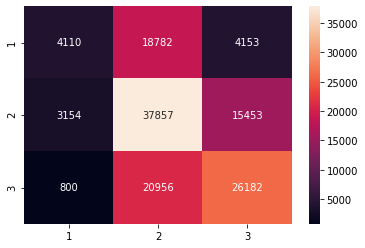

In [0]:
# With Additional Features
calculate_f1(pred_train, y_train)

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.4894028182615591


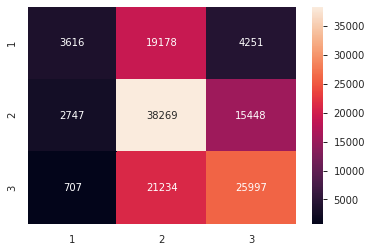

In [0]:
# Without Additional Features
calculate_f1(pred_train, y_train)

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.49499163606700236


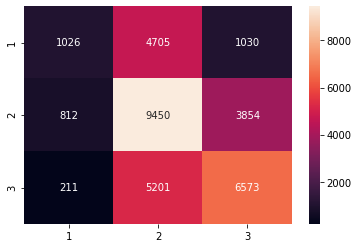

In [0]:
# With Additional Features
calculate_f1(pred_cv, y_cv)

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.49112182859818315


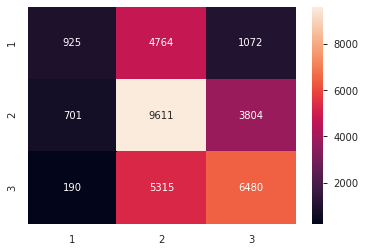

In [0]:
# Without Additional Features
calculate_f1(pred_cv, y_cv)

In [0]:
make_submission(test_std, test_ID, clf, "basic_baseline_LR_standardized_withAdditional_features")

'File Saved to Drive'

As we can see from the above baseline model, the additional features improve the performance of the model. So I will keep these features.

# Tuning Logistic Regression

In [0]:
lr = LogisticRegression(random_state=2)

params = {
    "C": [10 ** x for x in range(-5, 5)],
    "penalty": ['l1', 'l2'],
    "solver": ["newton-cg", "lbfgs", "sag", "saga"]
}

grid = GridSearchCV(lr, param_grid=params, scoring="f1_weighted", cv=3, verbose=10)
grid.fit(x_train_std, y_train)

print("The Best Weighted F1-Score: ", grid.best_score_)
print("The Best Parameters are: ", grid.best_params_)

Fitting 3 folds for each of 80 candidates, totalling 240 fits
[CV] C=1e-05, penalty=l1, solver=newton-cg ...........................
[CV] . C=1e-05, penalty=l1, solver=newton-cg, score=nan, total=   0.0s
[CV] C=1e-05, penalty=l1, solver=newton-cg ...........................
[CV] . C=1e-05, penalty=l1, solver=newton-cg, score=nan, total=   0.0s
[CV] C=1e-05, penalty=l1, solver=newton-cg ...........................
[CV] . C=1e-05, penalty=l1, solver=newton-cg, score=nan, total=   0.0s
[CV] C=1e-05, penalty=l1, solver=lbfgs ...............................
[CV] ..... C=1e-05, penalty=l1, solver=lbfgs, score=nan, total=   0.0s
[CV] C=1e-05, penalty=l1, solver=lbfgs ...............................
[CV] ..... C=1e-05, penalty=l1, solver=lbfgs, score=nan, total=   0.0s
[CV] C=1e-05, penalty=l1, solver=lbfgs ...............................
[CV] ..... C=1e-05, penalty=l1, solver=lbfgs, score=nan, total=   0.0s
[CV] C=1e-05, penalty=l1, solver=sag .................................
[CV] ....... C=

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.2s remaining:    0.0s


[CV] ....... C=1e-05, penalty=l1, solver=sag, score=nan, total=   0.0s
[CV] C=1e-05, penalty=l1, solver=sag .................................
[CV] ....... C=1e-05, penalty=l1, solver=sag, score=nan, total=   0.0s
[CV] C=1e-05, penalty=l1, solver=saga ................................


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.2s remaining:    0.0s


[CV] .... C=1e-05, penalty=l1, solver=saga, score=0.258, total=   0.2s
[CV] C=1e-05, penalty=l1, solver=saga ................................
[CV] .... C=1e-05, penalty=l1, solver=saga, score=0.258, total=   0.2s
[CV] C=1e-05, penalty=l1, solver=saga ................................
[CV] .... C=1e-05, penalty=l1, solver=saga, score=0.258, total=   0.2s
[CV] C=1e-05, penalty=l2, solver=newton-cg ...........................
[CV]  C=1e-05, penalty=l2, solver=newton-cg, score=0.366, total=   2.6s
[CV] C=1e-05, penalty=l2, solver=newton-cg ...........................
[CV]  C=1e-05, penalty=l2, solver=newton-cg, score=0.369, total=   2.6s
[CV] C=1e-05, penalty=l2, solver=newton-cg ...........................
[CV]  C=1e-05, penalty=l2, solver=newton-cg, score=0.366, total=   2.6s
[CV] C=1e-05, penalty=l2, solver=lbfgs ...............................
[CV] ... C=1e-05, penalty=l2, solver=lbfgs, score=0.366, total=   0.9s
[CV] C=1e-05, penalty=l2, solver=lbfgs ...............................
[CV

[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed: 23.1min finished


The Best Weighted F1-Score:  0.4937049574161889
The Best Parameters are:  {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}


In [0]:
bst = grid.best_estimator_

pred_train = bst.predict(x_train_std)
pred_cv = bst.predict(x_cv_std)

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.49406779066771656


<IPython.core.display.Javascript object>

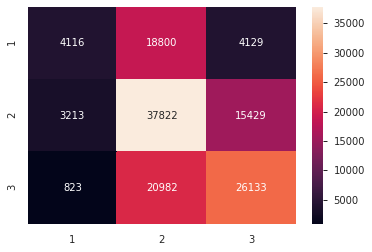

In [0]:
calculate_f1(pred_train, y_train)

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.4947537978516071


<IPython.core.display.Javascript object>

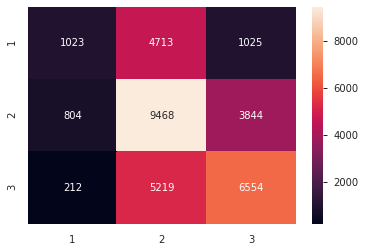

In [0]:
calculate_f1(pred_cv, y_cv)

In [0]:
make_submission(test_std, test_ID, bst, "LR_Hypertuned")

'File Saved to Drive'

# XGBoost Model

In [0]:
import xgboost as xgb
import joblib

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from time import time
from scipy.stats import randint as sp_randint
from scipy import sparse

In [0]:
xgb_model = xgb.XGBClassifier(tree_method = "gpu_hist", objective="multi:softmax", num_class=3)
params = {"max_depth": [2, 3, 4,5, 7, 10],
              "min_child_weight": [3, 4,5,6,7,8,9],
              "gamma":[0,0.1,0.2, 0.3, 0.5,0.7,0.9],
              "colsample_bytree":[0.1,0.2, 0.3, 0.5, 0.7,0.8,0.9],
              "nthread":[2, 3,4,5, 6, 7],
          "n_estimators": [20*i for i in range(1, 50)]
}

# run randomized search
n_iter= 20
random_search = RandomizedSearchCV(xgb_model, param_distributions=params,
                                   n_iter=n_iter, verbose=2, scoring="f1_weighted")

start = time()
random_search.fit(x_train_std, y_train)

print("RandomizedSearchCV took %.2f seconds for %d candidates parameter settings." % ((time() - start), n_iter))

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8, total=  15.8s
[CV] nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   15.8s remaining:    0.0s


[CV]  nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8, total=  14.7s
[CV] nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8 
[CV]  nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8, total=  14.8s
[CV] nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8 
[CV]  nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8, total=  14.6s
[CV] nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8 
[CV]  nthread=4, n_estimators=700, min_child_weight=9, max_depth=5, gamma=0.1, colsample_bytree=0.8, total=  14.7s
[CV] nthread=6, n_estimators=100, min_child_weight=7, max_depth=3, gamma=0.7, colsample_bytree=0.1 
[CV]  nthread=6, n_estimators=100, min_child_weight=7, max_depth=3, gamma=0.7, colsample_bytree=0.1, total=   1.9s
[CV] nthread=6, n_estimat

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 20.7min finished


RandomizedSearchCV took 1254.12 seconds for 20 candidates parameter settings.


In [0]:
random_search.best_params_

{'colsample_bytree': 0.9,
 'gamma': 0.7,
 'max_depth': 5,
 'min_child_weight': 8,
 'n_estimators': 520,
 'nthread': 2}

In [0]:
#xgb1 = RandomForestRegressor(max_features='sqrt',n_estimators=40, max_depth=5)
xgb1 = random_search.best_estimator_
xgb1.fit(x_train_std, y_train)

y_pred_cv = xgb1.predict(x_cv_std)

y_pred_train = xgb1.predict(x_train_std)

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.5835605059151744


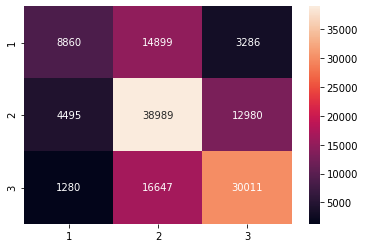

In [0]:
calculate_f1(y_pred_train, y_train)

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.5341764222708018


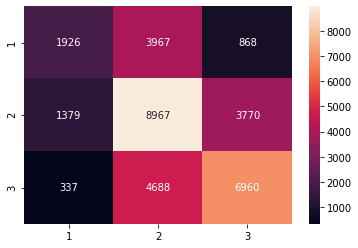

In [0]:
calculate_f1(y_pred_cv, y_cv)

In [0]:
make_submission(test_std, test_ID, xgb1, "XGBoost_normalized")

'File Saved to Drive'

In [0]:
joblib.dump(xgb1, "Models/XGBoost_normalized")

['Models/XGBoost_normalized']

# LightGBM

In [0]:
def lgb_f1_score(y_pred, data):
    """
      Custom F1_score function to be used for LGBMClassifier training
    """
    y_true = data.get_label()
    y_pred = y_pred.reshape(-1, 3)
    y_pred = y_pred.argmax(axis = 1)
    f_score = f1_score(y_true, y_pred, average = 'weighted')
    return 'f1_score', f_score, True

In [0]:
# import lightgbm as lgb

params = {'num_leaves': 64,
          'min_data_in_leaf': 20,
          'objective': 'multiclass',
          'num_class': 3,
          'max_depth': 5,
          'learning_rate': 0.07,
          "boosting": "gbdt",
          "bagging_freq": 5,
          "bagging_fraction": 0.85,
          "bagging_seed": 11,
          'reg_alpha': 0.1302650970728192,
          'reg_lambda': 0.3603427518866501
}

# making lgbm datasets for train and valid

# The LGBM model expects labels to be 0-2 when num_class=3, but our data set has
# labels 1-3, it will cause an error. To avoid that I will make the labels 0-2
# and restore the original values after the prediction is done.
y_train_mod = y_train - 1
y_cv_mod = y_cv - 1

d_train = lgb.Dataset(x_train_std, label=y_train_mod, free_raw_data=False)
d_valid = lgb.Dataset(x_cv_std, label=y_cv_mod, free_raw_data=False, reference=d_train)


# # training with early stop
evals_result = {}
bst = lgb.train(params, d_train, 5000, valid_sets=[d_train, d_valid], valid_names=["Train", "Validation"],\
                verbose_eval=20, early_stopping_rounds=500, evals_result=evals_result)

pred_train_probs = bst.predict(x_train_std)
pred_train_probs.reshape(3, -1)
pred_train = pred_train_probs.argmax(axis=1)+1

pred_cv_probs = bst.predict(x_cv_std)
pred_cv_probs.reshape(3, -1)
pred_cv = pred_cv_probs.argmax(axis=1)+1

Training until validation scores don't improve for 500 rounds.
[20]	Train's multi_logloss: 0.977846	Validation's multi_logloss: 0.98165
[40]	Train's multi_logloss: 0.95047	Validation's multi_logloss: 0.956624
[60]	Train's multi_logloss: 0.935991	Validation's multi_logloss: 0.944353
[80]	Train's multi_logloss: 0.926947	Validation's multi_logloss: 0.937531
[100]	Train's multi_logloss: 0.920348	Validation's multi_logloss: 0.932914
[120]	Train's multi_logloss: 0.915064	Validation's multi_logloss: 0.929752
[140]	Train's multi_logloss: 0.910906	Validation's multi_logloss: 0.927382
[160]	Train's multi_logloss: 0.907373	Validation's multi_logloss: 0.925371
[180]	Train's multi_logloss: 0.904407	Validation's multi_logloss: 0.924038
[200]	Train's multi_logloss: 0.901667	Validation's multi_logloss: 0.923129
[220]	Train's multi_logloss: 0.89889	Validation's multi_logloss: 0.922201
[240]	Train's multi_logloss: 0.896247	Validation's multi_logloss: 0.921234
[260]	Train's multi_logloss: 0.894219	Valida

In [0]:
# Convert the class labels back to [1,3] range
pred_train += 1
pred_cv += 1

In [0]:
np.unique(pred_train)

array([0, 1, 2])

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.5794815335374887


<IPython.core.display.Javascript object>

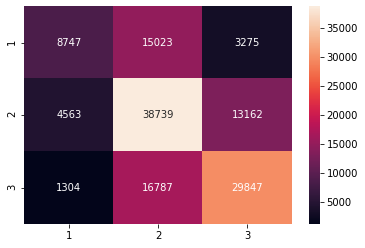

In [0]:
calculate_f1(pred_train, y_train)

Calculating the Weighted F1 Score
The Weighted F1_Score:  0.5354539354982454


<IPython.core.display.Javascript object>

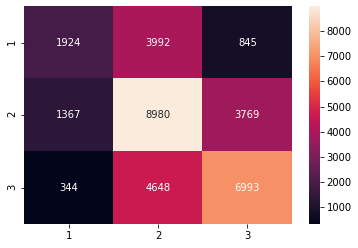

In [0]:
calculate_f1(pred_cv, y_cv)

<IPython.core.display.Javascript object>

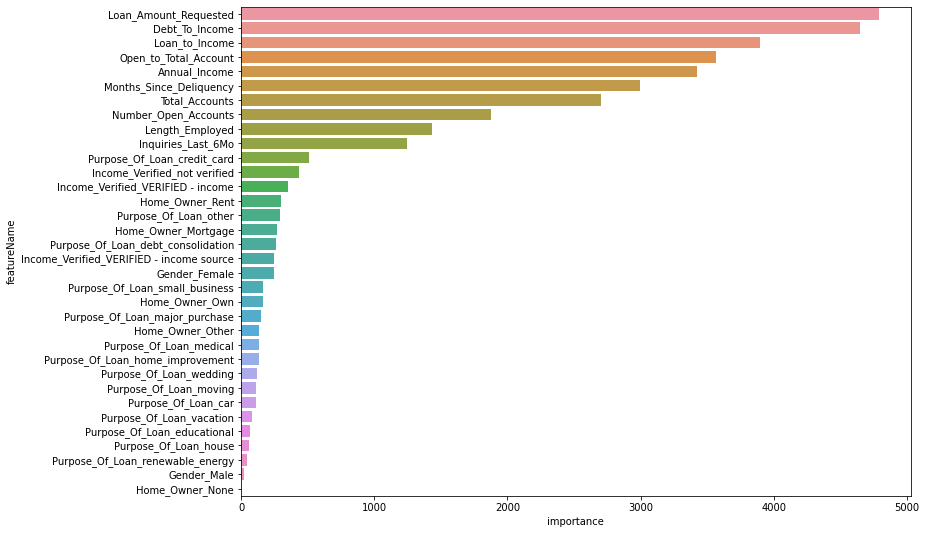

In [0]:
features = x_train.columns
importance = lgbr_model.feature_importances_

lgbmMetrics = pd.concat([pd.Series(features), pd.Series(importance)], axis=1)
lgbmMetrics.columns = ['featureName', 'importance']
metrics_sorted = lgbmMetrics.sort_values('importance', ascending=False)
g = sns.barplot(x="importance", y="featureName", data=metrics_sorted)
g.figure.set_size_inches(12, 9)
plt.show()

In [0]:
make_submission(test_std, test_ID, bst, "LGBM_model_normalized", isProb=True)

Unique values:  [1 2 3]


'File Saved to Drive'